In [33]:
!pip install catboost

Defaulting to user installation because normal site-packages is not writeable


In [34]:
import pandas as pd
import numpy as np
from sklearn import svm
from sklearn.ensemble import ExtraTreesRegressor
from sklearn.metrics import r2_score
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import GridSearchCV

from sklearn.model_selection import train_test_split
import catboost as cb
import math


In [35]:
folder = ""
just_scoring = True
if just_scoring:
  preprocessed = folder + "preprocessed_data/"
else:
  preprocessed = folder + "ready_data//"

In [36]:
#X = pd.read_csv(preprocessed + 'X_preprocessed.csv',index_col=['id'])
#y = pd.read_csv(preprocessed + 'y_preprocessed.csv',index_col=['id'])

In [37]:
x_train = pd.read_csv(preprocessed + 'X_train_preprocessed.csv',index_col=['id'])
x_test = pd.read_csv(preprocessed + 'X_test_preprocessed.csv',index_col=['id'])
y_train = pd.read_csv(preprocessed + 'y_train_preprocessed.csv',index_col=['id'])
y_test = pd.read_csv(preprocessed + 'y_test_preprocessed.csv',index_col=['id'])

In [38]:
TRAIN_RATIO = 0.8

def performance(y_pred):
  varb = y_test.empty
  if not y_test.empty:
    return r2_score(y_test,y_pred,)

def train_len(data = x_train):
  return math.floor(TRAIN_RATIO*len(data))

def validation_len(data = x_train):
    return len(data) - train_len(data)

def train(data = x_train):
    if isinstance(data, np.ndarray):
        return data[:train_len(data)].copy()
    return data.iloc[:train_len(data)].copy()

def validation(data = x_train):
    if isinstance(data, np.ndarray):
        return data[-validation_len(data):].copy()
    return data.iloc[-validation_len(data):].copy()

In [39]:
!pip install tensorflow-cpu

Defaulting to user installation because normal site-packages is not writeable


In [40]:
!pip install keras

Defaulting to user installation because normal site-packages is not writeable


In [41]:
X_NN = x_train
x_test_NN = x_test
y_train_NN = y_train
y_test_NN = y_test

In [42]:
from keras import regularizers
import tensorflow as tf
normalizer = tf.keras.layers.Normalization(axis=-1)
normalizer.adapt(X_NN)

from keras.callbacks import ModelCheckpoint
from keras.models import Sequential
from keras.layers import Dense, Activation, Flatten
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_absolute_error
from keras.layers import LeakyReLU
from tensorflow import keras
from keras.layers import Dropout
from sklearn.metrics import r2_score
from keras import backend as K

def coeff_determination(y_true, y_pred):
    from keras import backend as K
    SS_res =  K.sum(K.square( y_true-y_pred ))
    SS_tot = K.sum(K.square( y_true - K.mean(y_true) ) )
    return ( 1 - SS_res/(SS_tot + K.epsilon()) )

model = Sequential(normalizer)
model.add(Dense(512, input_dim=X_NN.shape[1], activation=LeakyReLU(alpha=0.01)))
model.add(Dropout(0.3,seed=1),)
model.add(Dense(256, activation='selu',kernel_regularizer = regularizers.l2(1)))
model.add(Dropout(0.3,seed=1),)
model.add(Dense(128, activation='selu',kernel_regularizer = regularizers.l2(1)))
model.add(Dropout(0.3,seed=1),)
model.add(Dense(128, activation='selu',kernel_regularizer = regularizers.l2(1)))
model.add(Dropout(0.3,seed=1),)
model.add(Dense(128, activation='selu',kernel_regularizer = regularizers.l2(1)))
model.add(Dropout(0.2,seed=1),)
model.add(Dense(64, activation='selu',kernel_regularizer = regularizers.l2(1)))
model.add(Dropout(0.2,seed=1),)
model.add(Dense(64, activation='selu',kernel_regularizer = regularizers.l2(1)))
model.add(Dropout(0.2,seed=1),)
model.add(Dense(32, activation='selu',kernel_regularizer = regularizers.l2(1)))
model.add(Dense(1, activation='selu'))

# Compile the network :
opt = keras.optimizers.Adam(learning_rate=0.0005)
model.compile(loss='mean_absolute_error', optimizer="adam", metrics=[tf.keras.metrics.MeanAbsoluteError()])
print(model.summary())
history = model.fit(np.array(X_NN), np.array(y_train_NN), epochs=150, batch_size=32, validation_split = 0.2,)
'''
0.3109574108528159
model = Sequential(normalizer)
model.add(Dense(512, input_dim=X_NN.shape[1], activation=LeakyReLU(alpha=0.01)))
model.add(Dropout(0.3,seed=1),)
model.add(Dense(256, activation='selu',kernel_regularizer = regularizers.l2(1)))
model.add(Dropout(0.3,seed=1),)
model.add(Dense(128, activation='selu',kernel_regularizer = regularizers.l2(1)))
model.add(Dropout(0.3,seed=1),)
model.add(Dense(128, activation='selu',kernel_regularizer = regularizers.l2(1)))
model.add(Dropout(0.3,seed=1),)
model.add(Dense(128, activation='selu',kernel_regularizer = regularizers.l2(1)))
model.add(Dropout(0.2,seed=1),)
model.add(Dense(64, activation='selu',kernel_regularizer = regularizers.l2(1)))
model.add(Dropout(0.2,seed=1),)
model.add(Dense(64, activation='selu',kernel_regularizer = regularizers.l2(1)))
model.add(Dropout(0.2,seed=1),)
model.add(Dense(32, activation='selu',kernel_regularizer = regularizers.l2(1)))
model.add(Dense(1, activation='selu'))
'''

2022-11-04 17:55:58.726528: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2022-11-04 17:56:01.449696: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 normalization (Normalizatio  (None, 200)              401       
 n)                                                              
                                                                 
 dense (Dense)               (None, 512)               102912    
                                                                 
 dropout (Dropout)           (None, 512)               0         
                                                                 
 dense_1 (Dense)             (None, 256)               131328    
                                                                 
 dropout_1 (Dropout)         (None, 256)               0         
                                                                 
 dense_2 (Dense)             (None, 128)               32896     
                                                        

"\n0.3109574108528159\nmodel = Sequential(normalizer)\nmodel.add(Dense(512, input_dim=X_NN.shape[1], activation=LeakyReLU(alpha=0.01)))\nmodel.add(Dropout(0.3,seed=1),)\nmodel.add(Dense(256, activation='selu',kernel_regularizer = regularizers.l2(1)))\nmodel.add(Dropout(0.3,seed=1),)\nmodel.add(Dense(128, activation='selu',kernel_regularizer = regularizers.l2(1)))\nmodel.add(Dropout(0.3,seed=1),)\nmodel.add(Dense(128, activation='selu',kernel_regularizer = regularizers.l2(1)))\nmodel.add(Dropout(0.3,seed=1),)\nmodel.add(Dense(128, activation='selu',kernel_regularizer = regularizers.l2(1)))\nmodel.add(Dropout(0.2,seed=1),)\nmodel.add(Dense(64, activation='selu',kernel_regularizer = regularizers.l2(1)))\nmodel.add(Dropout(0.2,seed=1),)\nmodel.add(Dense(64, activation='selu',kernel_regularizer = regularizers.l2(1)))\nmodel.add(Dropout(0.2,seed=1),)\nmodel.add(Dense(32, activation='selu',kernel_regularizer = regularizers.l2(1)))\nmodel.add(Dense(1, activation='selu'))\n"

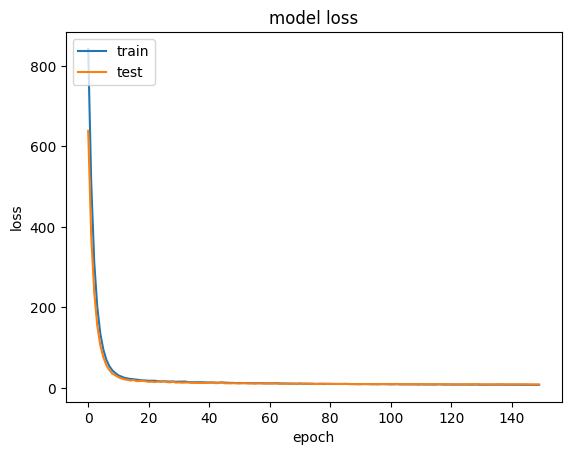

In [43]:
import matplotlib.pyplot as plt


# summarize history for loss
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

In [44]:
y_pred_nn = model.predict(x_test_NN)
y_pred_nn = np.ravel(y_pred_nn)
if not y_test_NN.empty:
    print( r2_score(y_test_NN,y_pred_nn))

8/8 [==============================] - 0s 2ms/step
0.27726257760637574


In [45]:
!pip install lightgbm

Defaulting to user installation because normal site-packages is not writeable


In [46]:
import lightgbm as lgb

# create dataset for lightgbm
lgb_train = lgb.Dataset(x_train, y_train)
lgb_test = lgb.Dataset(x_test, y_test, reference=lgb_train)

In [47]:
# specify your configurations as a dict
params = {
    'task': 'train',
    'boosting_type': 'gbdt',
    'objective': 'regression',
    #'metric': {'l1', 'l2'},
    'num_leaves': 50,
    'learning_rate': 0.01,
    'feature_fraction': 0.5,
    'bagging_fraction': 0.8,
    'bagging_freq': 5,
    'verbose': 0
}

def custom_r2(preds, train_data):
    labels = train_data.get_label()
    return 'r2', r2_score(labels, preds), True
# train
gbm = lgb.train(params,
                lgb_train,
                num_boost_round=1000,
                feval=custom_r2,
                valid_sets={lgb_train, lgb_test},
                early_stopping_rounds=50
               )

/usr/lib/python3.10/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002756 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[1]	training's l2: 87.914	training's r2: 0.0113207	valid_0's l2: 81.4122	valid_0's r2: 0.00655301
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[2]	training's l2: 86.9483	training's r2: 0.0221803	valid_0's l2: 80.7829	valid_0's r2: 0.0142321
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[3]	training's l2: 85.9687	training's r2: 0.0331977	valid_0's l2: 80.1224	valid_0's r2: 0.0222922
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[4]	training's l2: 85.0465	training's r2: 0.0435682	valid_0's l2: 79.6087	valid_0's r2: 0.0285603
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[5]	tra

In [48]:
y_pred_lgbm = gbm.predict(x_test, num_iteration=gbm.best_iteration)
print(performance(y_pred_lgbm))
#0.42787093167380685 k=120
#0.4417529000835657 k = 150
#0.4059320481021389 k = 100
#0.41670827750282924 k = 130
#0.4155919070669466 k = 110


0.40277324384199087


In [49]:
import numpy as np
from sklearn.metrics import mean_squared_error
from sklearn.datasets import make_friedman1
from sklearn.ensemble import GradientBoostingRegressor

mod = GradientBoostingRegressor(
    n_estimators=80, random_state = 0
)
mod.fit(np.array(x_train), np.ravel(y_train))
y_pred_gbr = mod.predict(np.array(x_test))
print(performance(y_pred_gbr))
#0.4109502743903839 k=120
#0.40526442752102065 k = 150
#0.3841232123612399 k = 100
#0.41130731785721 k = 130
#0.41014396209251347 k = 110


0.3637431727355994


In [50]:
from sklearn.gaussian_process.kernels import RationalQuadratic, ExpSineSquared, RBF, DotProduct, Matern, ConstantKernel, WhiteKernel, PairwiseKernel, CompoundKernel
from sklearn.gaussian_process import GaussianProcessRegressor
kernel = RBF()
gpc = GaussianProcessRegressor(normalize_y=True, kernel=kernel,random_state=0)
gpc.fit(np.array(x_train), np.ravel(y_train))
y_pred_gpr = gpc.predict(np.array(x_test))
y_pred_gpr = np.ravel(y_pred_gpr)
print(performance(y_pred_gpr))
#0.4814665809780243 k = 120
#0.4534585121517528 k = 150
#0.4733945218161426 k = 100
#0.4561416836658333 k = 130
#0.4728459798080792 k = 110


-0.0011233616072801045


In [51]:
rfr = ExtraTreesRegressor(n_jobs=-1, max_depth=None, random_state=0,
                          max_features=None,)

param_grid = {
    'n_estimators' : [250,300,341,350,400,500],
    'max_depth': [None,10,50,100],
    'max_leaf_nodes':[None,10,50,100,200]
}

gcv = GridSearchCV(rfr,param_grid,cv=10,n_jobs=-1).fit(x_train,y_train.values.ravel())

#rfr.fit(x_train, np.ravel(y_train))

y_pred_extra_trees = gcv.predict(x_test)

print(performance(y_pred_extra_trees))
#0.4212718743068148 k = 120
#0.4198053058315343 k=150
#0.4215281814902644 k = 100
#0.41426719108498855 k = 130
#0.4172282346342855 k = 110


0.42194368623729595


In [52]:
gcv.best_params_

{'max_depth': None, 'max_leaf_nodes': None, 'n_estimators': 250}

In [53]:
grid_svr = GridSearchCV(

estimator=svm.SVR(kernel='rbf'),
        param_grid={
            'C': [20, 23, 25, 28, 30, 31, 32, 33, 34, 35, 38, 39, 40, 45, 50, 80, 100], #[1/10, 1, 10, 25, 50, 100],
            'epsilon': [0.0001, 0.0003, 0.007, 0.0109, 0.019, 0.05, 0.06, 0.07, 0.08, 0.1, 0.15, 0.18, 0.19, 0.2, 0.21, 0.22, 0.23, 0.24, 0.25, 0.26, 0.27, 0.28, 0.29, 0.3, 0.31, 0.32, 0.35, 0.38, 0.4, 0.45, 0.47, 0.48, 0.5, 0.51, 0.52, 0.53, 0.54, 0.55, 0.56, 0.6, 0.7, 0.8] #0.0001, 0.0003, 0.007, 0.0109, 0.019,0.05, 0.06, 0.07, 0.08, 0.1, 0.15, 0.2,
        },
        cv=10, scoring='r2', n_jobs=-1)
grid_svr.fit(x_train, np.ravel(y_train))

GridSearchCV(cv=10, estimator=SVR(), n_jobs=-1,
             param_grid={'C': [20, 23, 25, 28, 30, 31, 32, 33, 34, 35, 38, 39,
                               40, 45, 50, 80, 100],
                         'epsilon': [0.0001, 0.0003, 0.007, 0.0109, 0.019, 0.05,
                                     0.06, 0.07, 0.08, 0.1, 0.15, 0.18, 0.19,
                                     0.2, 0.21, 0.22, 0.23, 0.24, 0.25, 0.26,
                                     0.27, 0.28, 0.29, 0.3, 0.31, 0.32, 0.35,
                                     0.38, 0.4, 0.45, ...]},
             scoring='r2')

In [54]:
print("best parameters are: ", grid_svr.best_params_)

best parameters are:  {'C': 80, 'epsilon': 0.0001}


In [55]:
y_pred_svr = grid_svr.predict(x_test)

print(performance(y_pred_svr))
#0.4564526871697161 k = 120
#0.4345425145286925 k = 150
#0.43736879664733896 k = 100
#0.4398857686750022 k = 130
#0.445489528177074 k = 110


0.4263221203933085


In [56]:
from sklearn.ensemble import RandomForestRegressor

regr_random_forest = RandomForestRegressor(n_estimators=800, max_depth=10, random_state=0, n_jobs=-1)
regr_random_forest.fit(x_train, np.ravel(y_train))
y_pred_random_for = regr_random_forest.predict(x_test)

print(performance(y_pred_random_for))
#0.38263232701377947 k = 120
#0.3755322826479851 k=150
#0.3751342085259539 k=100
#0.3713326852364862 k = 130
#0.37229452588351186 k = 110


0.38363364259748167


In [57]:
from catboost.utils import get_gpu_device_count
print('I see %i GPU devices' % get_gpu_device_count())

I see 1 GPU devices


In [58]:
catboost_model = cb.CatBoostRegressor(random_seed=0)
grid_catbooost = {'iterations': [200, 250, 300, 350, 400],
        'learning_rate': [0.05, 0.1, 0.2,0.5],
        'depth': [1, 2, 3, 4, 5],
        'l2_leaf_reg': [0.05, 0.1, 0.2, 0.5, 1, 2]}
catboost_model.grid_search(grid_catbooost, x_train, np.ravel(y_train),cv=10)
#Cross validation has to be done on validation set

0:	learn: 67.1696386	test: 67.0127161	best: 67.0127161 (0)	total: 54.6ms	remaining: 10.9s
1:	learn: 63.8762817	test: 63.7182347	best: 63.7182347 (1)	total: 57.2ms	remaining: 5.66s
2:	learn: 60.7528061	test: 60.5943655	best: 60.5943655 (2)	total: 59.7ms	remaining: 3.92s
3:	learn: 57.7840767	test: 57.6210678	best: 57.6210678 (3)	total: 62.1ms	remaining: 3.04s
4:	learn: 54.9660116	test: 54.7999577	best: 54.7999577 (4)	total: 65.6ms	remaining: 2.56s
5:	learn: 52.2972613	test: 52.1264387	best: 52.1264387 (5)	total: 67.7ms	remaining: 2.19s
6:	learn: 49.7618045	test: 49.5869262	best: 49.5869262 (6)	total: 69.9ms	remaining: 1.93s
7:	learn: 47.3570817	test: 47.1845698	best: 47.1845698 (7)	total: 72.3ms	remaining: 1.74s
8:	learn: 45.0812234	test: 44.9107442	best: 44.9107442 (8)	total: 79.4ms	remaining: 1.68s
9:	learn: 42.9241950	test: 42.7519939	best: 42.7519939 (9)	total: 82.7ms	remaining: 1.57s
10:	learn: 40.8795663	test: 40.7053039	best: 40.7053039 (10)	total: 84.9ms	remaining: 1.46s
11:	lear

{'params': {'depth': 1,
  'iterations': 400,
  'learning_rate': 0.2,
  'l2_leaf_reg': 0.05},
 'cv_results': defaultdict(list,
             {'iterations': [0,
               1,
               2,
               3,
               4,
               5,
               6,
               7,
               8,
               9,
               10,
               11,
               12,
               13,
               14,
               15,
               16,
               17,
               18,
               19,
               20,
               21,
               22,
               23,
               24,
               25,
               26,
               27,
               28,
               29,
               30,
               31,
               32,
               33,
               34,
               35,
               36,
               37,
               38,
               39,
               40,
               41,
               42,
               43,
               44,
               

In [59]:
y_pred_catboost = catboost_model.predict(x_test)

print(performance(y_pred_catboost))
#0.37096077880846823 k = 120
#0.3688273815432537 k = 150
#0.3796823732529593 k = 100
#0.37141693779953233 k=130
#0.25922068424008127 k=110


0.21825105501401354


In [60]:
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import StackingRegressor
level0 = list()
level0.append(('GP', gpc))
level0.append(('extra_tree', rfr))
level0.append(('svm', grid_svr.best_estimator_))
level1 = LinearRegression()
stacking_reg = StackingRegressor(estimators=level0, final_estimator=level1, cv=10)
stacking_reg.fit(x_train, np.ravel(y_train))

StackingRegressor(cv=10,
                  estimators=[('GP',
                               GaussianProcessRegressor(kernel=RBF(length_scale=1),
                                                        normalize_y=True,
                                                        random_state=0)),
                              ('extra_tree',
                               ExtraTreesRegressor(max_features=None, n_jobs=-1,
                                                   random_state=0)),
                              ('svm', SVR(C=80, epsilon=0.0001))],
                  final_estimator=LinearRegression())

In [61]:
y_stacking_3 = stacking_reg.predict(x_test)
print(performance(y_stacking_3))

0.44225297059950275


In [62]:
level0 = list()
level0.append(('GP', gpc))
level0.append(('extra_tree', rfr))
level0.append(('svm', grid_svr.best_estimator_))
level0.append(('gbr', mod))
level1 = LinearRegression()
stacking_reg_4 = StackingRegressor(estimators=level0, final_estimator=level1, cv=10)
stacking_reg_4.fit(x_train, np.ravel(y_train))

StackingRegressor(cv=10,
                  estimators=[('GP',
                               GaussianProcessRegressor(kernel=RBF(length_scale=1),
                                                        normalize_y=True,
                                                        random_state=0)),
                              ('extra_tree',
                               ExtraTreesRegressor(max_features=None, n_jobs=-1,
                                                   random_state=0)),
                              ('svm', SVR(C=80, epsilon=0.0001)),
                              ('gbr',
                               GradientBoostingRegressor(n_estimators=80,
                                                         random_state=0))],
                  final_estimator=LinearRegression())

In [63]:
y_stacking_4 = stacking_reg_4.predict(x_test)
print(performance(y_stacking_4))

0.4386180321030485


In [64]:
level0 = list()
level0.append(('GP', gpc))
level0.append(('extra_tree', rfr))
level1 = LinearRegression()
stacking_reg_2 = StackingRegressor(estimators=level0, final_estimator=level1, cv=10)
stacking_reg_2.fit(x_train, np.ravel(y_train))
y_stacking_2 = stacking_reg_2.predict(x_test)
print(performance(y_stacking_2))

0.40211016856820014


In [65]:
ensemble_pred  = (y_pred_extra_trees + y_pred_svr + y_pred_random_for  + y_pred_catboost + y_pred_gpr + y_pred_gbr + y_pred_lgbm)/7

print(performance(ensemble_pred))
#0.469588078973592 k = 120
#0.45699541297119506 k = 150
#0.4524360682481955 k = 100
#0.4515478678677596 k = 130
#0.4624519485290417 k = 110

0.41680177900141335


In [66]:
if just_scoring:
  extra_trees_perf = performance(y_pred_extra_trees)
  random_for_perf = performance(y_pred_random_for)
  catboost_perf = performance(y_pred_catboost)
  svr_perf = performance(y_pred_svr)
  gpr_perf = performance(y_pred_gpr)
  gbr_perf = performance(y_pred_gbr)
  #lgbm_perf = performance(y_pred_lgbm)
else:
    extra_trees_perf = 0.43091528588846495
    svr_perf = 0.44702595579327853
    random_for_perf = 0.3815054780797936
    catboost_perf = 0.41703333711700563
    gpr_perf = 0.4620910737351671
    gbr_perf = 0.4366241930586553
    lgbm_perf = 0.4231224116598067

tot_perf = extra_trees_perf + svr_perf + random_for_perf + catboost_perf + gpr_perf + gbr_perf + lgbm_perf

In [67]:
enseble_pred_top_3_tot = gpr_perf + svr_perf  + extra_trees_perf
ensemble_pred_weighted_top_3 = (y_pred_extra_trees * extra_trees_perf + y_pred_svr*svr_perf + y_pred_gpr*gpr_perf )/enseble_pred_top_3_tot
print(performance(ensemble_pred_weighted_top_3))

0.4531173084507778


In [68]:
enseble_pred_top_4_tot = gpr_perf + svr_perf + gbr_perf + extra_trees_perf
ensemble_pred_weighted_top_4 = (y_pred_extra_trees * extra_trees_perf + y_pred_svr*svr_perf + y_pred_gpr*gpr_perf + y_pred_gbr*gbr_perf )/enseble_pred_top_4_tot
print(performance(ensemble_pred_weighted_top_4))
# 0.4875291642220114 k = 120 svm + extra_trees + gbr + gpr
#0.4709725188805146 k = 150
#0.47156082937596067 k = 100
#0.4707594773357324 k = 130
#0.4807381818956489 k = 110

0.44635340737894036


In [69]:
ensemble_pred_weighted  = (y_pred_extra_trees * extra_trees_perf + y_pred_svr*svr_perf + y_pred_random_for * random_for_perf  + y_pred_catboost* catboost_perf + y_pred_gpr*gpr_perf + y_pred_gbr*gbr_perf + lgbm_perf*y_pred_lgbm)/tot_perf
print(performance(ensemble_pred_weighted))
#0.4727319402554333 k = 120
#0.4596058662445207 k = 150
#0.4557585874346525 k = 100
#0.4543190848570693 k = 130
#0.46677751533723666 k=110

0.430164595733453


In [70]:
pd.concat([pd.DataFrame(y_pred_extra_trees),pd.DataFrame(y_pred_svr),pd.DataFrame(y_pred_random_for),pd.DataFrame(y_pred_catboost),pd.DataFrame(y_pred_gpr),pd.DataFrame(y_pred_gbr),pd.DataFrame(y_pred_lgbm),pd.DataFrame(ensemble_pred_weighted)],axis = 1)

,0,0,0,0,0,0,0,0
0,65.148,63.835190,65.349138,62.405820,69.974194,65.801905,66.079579,64.944772
1,67.140,68.744382,69.235082,65.363553,69.974194,68.259623,68.165382,68.006745
2,71.920,71.048310,73.234542,73.081977,69.974194,71.267906,71.540719,71.915883
3,67.764,68.068974,65.903773,66.668258,69.974194,67.820224,66.354789,67.137371
4,74.220,71.847398,75.231406,72.419433,69.974194,74.974614,74.778414,73.995962
...,...,...,...,...,...,...,...,...
238,54.244,57.478364,55.712999,52.120769,69.974194,51.199366,54.035910,54.362904
239,60.296,55.700274,58.059967,56.446177,69.974194,56.112079,57.926467,57.526345
240,63.844,67.158700,61.035196,56.221276,69.974194,56.855018,61.335202,61.635174
241,66.320,67.962903,69.651231,67.195429,69.974194,65.838060,69.049155,67.726508


In [71]:
output_df = pd.DataFrame(ensemble_pred_weighted_top_3, columns = ['y'])
output_df

,y
0,64.480932
1,67.943643
2,71.483905
3,67.914547
4,73.031625
...,...
238,55.850826
239,57.970380
240,65.503985
241,67.141941


In [72]:
output_df.to_csv(preprocessed + 'output.csv', index_label="id")
output_df.to_csv(preprocessed + 'output.txt', index_label="id")

In [73]:
output_df2 = pd.DataFrame(y_stacking_3, columns = ['y'])
output_df2

,y
0,63.896686
1,67.630972
2,71.270672
3,67.690116
4,72.769058
...,...
238,54.603738
239,55.777571
240,65.832164
241,67.143438


In [74]:
output_df2.to_csv(preprocessed + 'output2.csv', index_label="id")
output_df2.to_csv(preprocessed + 'output2.txt', index_label="id")

In [75]:
output_df3 = pd.DataFrame(ensemble_pred_weighted_top_4, columns = ['y'])
output_df3

,y
0,64.877745
1,68.038561
2,71.419020
3,67.886213
4,73.615288
...,...
238,54.453553
239,57.412157
240,62.905884
241,66.750262


In [76]:
output_df3.to_csv(preprocessed + 'output3.csv', index_label="id")
output_df3.to_csv(preprocessed + 'output3.txt', index_label="id")

In [77]:
output_df4 = pd.DataFrame(y_stacking_4, columns = ['y'])
output_df4.to_csv(preprocessed + 'output4.csv', index_label="id")
output_df4.to_csv(preprocessed + 'output4.txt', index_label="id")

In [78]:
output_df5 = pd.DataFrame(y_stacking_2, columns = ['y'])
output_df5.to_csv(preprocessed + 'output5.csv', index_label="id")
output_df5.to_csv(preprocessed + 'output5.txt', index_label="id")